In [1]:
import argparse
import os
import numpy as np
import math
import re

import torchvision.transforms as transforms
from torchvision.utils import save_image

from torch.utils.data import DataLoader,Dataset
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch
from PIL import Image
import matplotlib.pyplot as plt
import torch.optim as optim
from sklearn.model_selection import train_test_split
device = torch.device("cuda" )


In [2]:

batch_size=32

# Dimensiones de la imagen
img_width, img_height = 64, 64

# Perfiles y acciones posibles
perfiles = ['front', 'left', 'right']
acciones = sorted(os.listdir("pruebas modelos/Sprites/frames"))  # Asegurar consistencia
num_acciones = len(acciones)  # Debe ser 3
num_perfiles = len(perfiles)  # Debe ser 3
num_movimientos = 8  # Movimientos 0-7

# Expresión regular para extraer el perfil y el número de movimiento
patron_nombre = re.compile(r'^(front|left|right)_\d+_(\d+)\.(png|jpg|jpeg)$')

class SpritesDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        label = torch.tensor(self.labels[idx], dtype=torch.long)  # Convertir a entero
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

# Listar rutas y etiquetas
ruta_base = "pruebas modelos/Sprites/frames"
rutas_imagenes = []
etiquetas = []

for accion_idx, accion in enumerate(acciones):
    ruta_accion = os.path.join(ruta_base, accion)
    
    if os.path.isdir(ruta_accion):
        for archivo in os.listdir(ruta_accion):
            if archivo.endswith(('.png', '.jpg', '.jpeg')):
                match = patron_nombre.match(archivo)
                
                if match:
                    perfil_str, mov_idx = match.groups()[0], int(match.groups()[1])
                    
                    if mov_idx >= num_movimientos:
                        continue  # Si el número de movimiento es inválido, ignorarlo

                    # Obtener índice del perfil
                    perfil_idx = perfiles.index(perfil_str)

                    rutas_imagenes.append(os.path.join(ruta_accion, archivo))

                    # Etiqueta única: acción * 24 + perfil * 8 + movimiento
                    etiqueta = (accion_idx * num_perfiles * num_movimientos) + (perfil_idx * num_movimientos) + mov_idx
                    etiquetas.append(etiqueta)

# Convertir listas a numpy arrays
rutas_imagenes = np.array(rutas_imagenes)
etiquetas = np.array(etiquetas, dtype=np.int64)  # Convertir etiquetas a enteros

# Dividir en entrenamiento y prueba
rutas_train, rutas_test, etiquetas_train, etiquetas_test = train_test_split(
    rutas_imagenes, etiquetas, test_size=0.2, random_state=42
)

# Transformaciones para las imágenes
transform = transforms.Compose([
    transforms.Resize((img_width, img_height)),
    transforms.ToTensor()
])

# Crear datasets y dataloaders
train_dataset = SpritesDataset(rutas_train, etiquetas_train, transform=transform)
test_dataset = SpritesDataset(rutas_test, etiquetas_test, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Número total de clases ahora es 72 (3 * 3 * 8)
num_classes = 72  

print(f"Total de imágenes: {len(etiquetas)}")
print(f"Total de clases: {num_classes}")


Total de imágenes: 93312
Total de clases: 72


Epoch 1/100 - Train Loss: 0.2106 - Test Loss: 0.1943


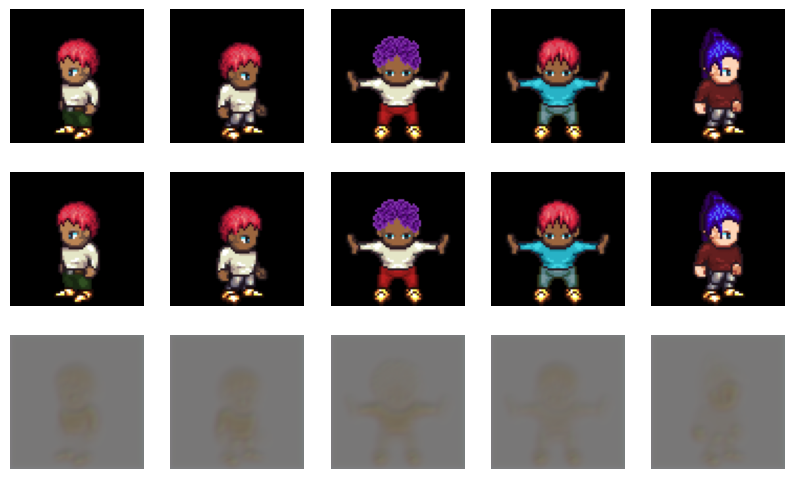

Epoch 2/100 - Train Loss: 0.1642 - Test Loss: 0.1287
Epoch 3/100 - Train Loss: 0.0920 - Test Loss: 0.0600
Epoch 4/100 - Train Loss: 0.0406 - Test Loss: 0.0271
Epoch 5/100 - Train Loss: 0.0207 - Test Loss: 0.0165
Epoch 6/100 - Train Loss: 0.0146 - Test Loss: 0.0131


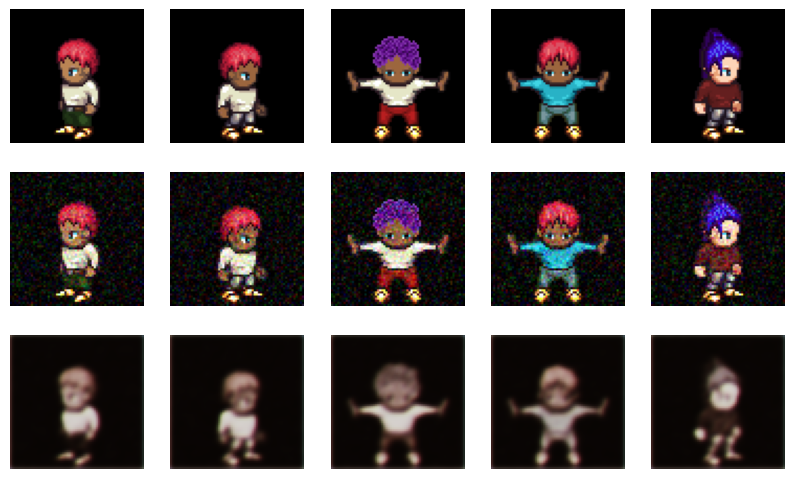

Epoch 7/100 - Train Loss: 0.0122 - Test Loss: 0.0112
Epoch 8/100 - Train Loss: 0.0105 - Test Loss: 0.0097
Epoch 9/100 - Train Loss: 0.0091 - Test Loss: 0.0083
Epoch 10/100 - Train Loss: 0.0078 - Test Loss: 0.0071
Epoch 11/100 - Train Loss: 0.0068 - Test Loss: 0.0065


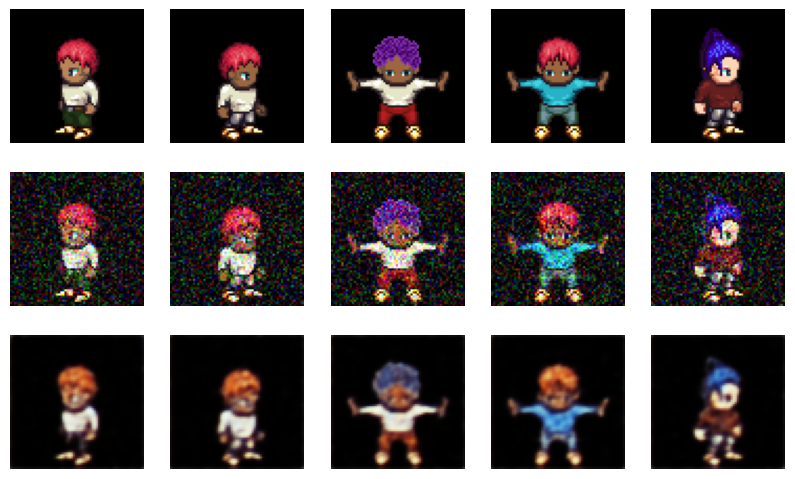

Epoch 12/100 - Train Loss: 0.0064 - Test Loss: 0.0061
Epoch 13/100 - Train Loss: 0.0061 - Test Loss: 0.0059
Epoch 14/100 - Train Loss: 0.0060 - Test Loss: 0.0058
Epoch 15/100 - Train Loss: 0.0058 - Test Loss: 0.0056
Epoch 16/100 - Train Loss: 0.0057 - Test Loss: 0.0056


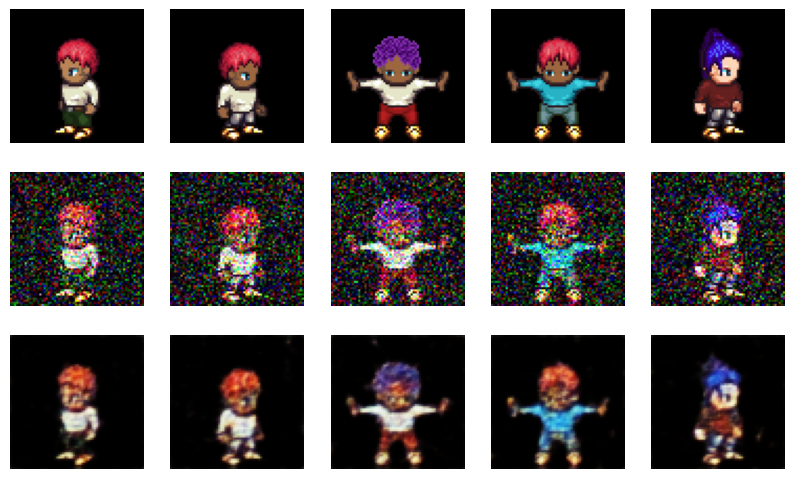

Epoch 17/100 - Train Loss: 0.0057 - Test Loss: 0.0056
Epoch 18/100 - Train Loss: 0.0058 - Test Loss: 0.0057
Epoch 19/100 - Train Loss: 0.0059 - Test Loss: 0.0059
Epoch 20/100 - Train Loss: 0.0062 - Test Loss: 0.0061
Epoch 21/100 - Train Loss: 0.0065 - Test Loss: 0.0064


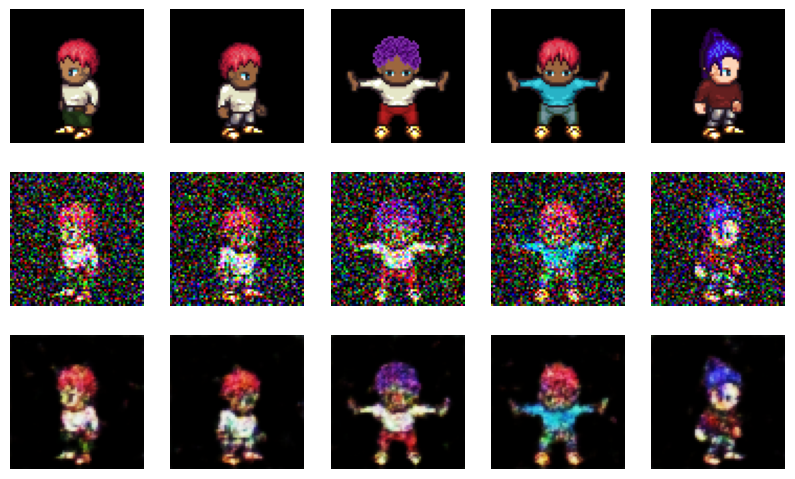

Epoch 22/100 - Train Loss: 0.0068 - Test Loss: 0.0068
Epoch 23/100 - Train Loss: 0.0071 - Test Loss: 0.0071
Epoch 24/100 - Train Loss: 0.0074 - Test Loss: 0.0074
Epoch 25/100 - Train Loss: 0.0078 - Test Loss: 0.0078
Epoch 26/100 - Train Loss: 0.0081 - Test Loss: 0.0081


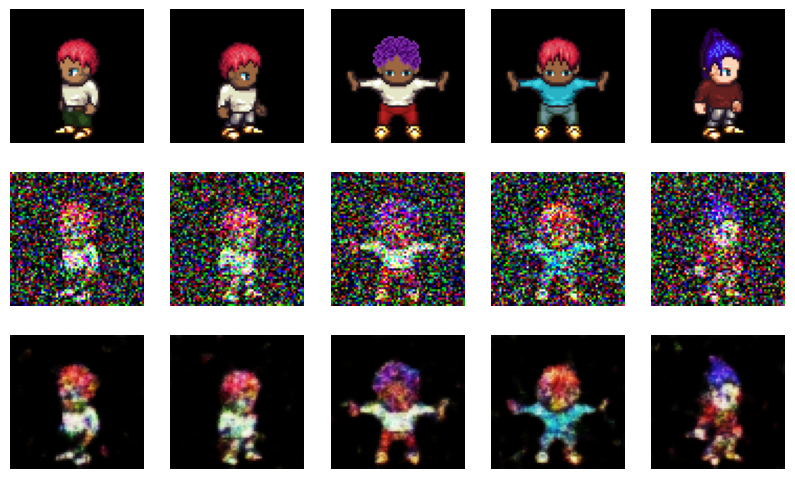

Epoch 27/100 - Train Loss: 0.0084 - Test Loss: 0.0084
Epoch 28/100 - Train Loss: 0.0088 - Test Loss: 0.0088
Epoch 29/100 - Train Loss: 0.0091 - Test Loss: 0.0091
Epoch 30/100 - Train Loss: 0.0094 - Test Loss: 0.0094
Epoch 31/100 - Train Loss: 0.0097 - Test Loss: 0.0097


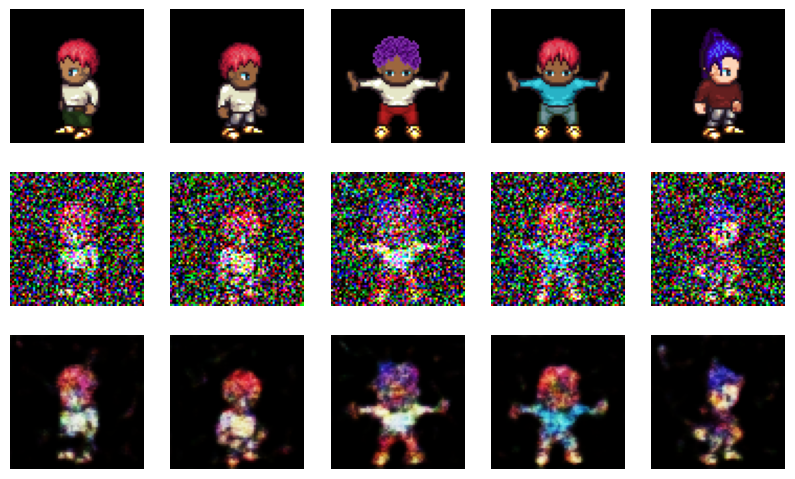

Epoch 32/100 - Train Loss: 0.0101 - Test Loss: 0.0100
Epoch 33/100 - Train Loss: 0.0104 - Test Loss: 0.0104
Epoch 34/100 - Train Loss: 0.0107 - Test Loss: 0.0107
Epoch 35/100 - Train Loss: 0.0110 - Test Loss: 0.0110
Epoch 36/100 - Train Loss: 0.0113 - Test Loss: 0.0113


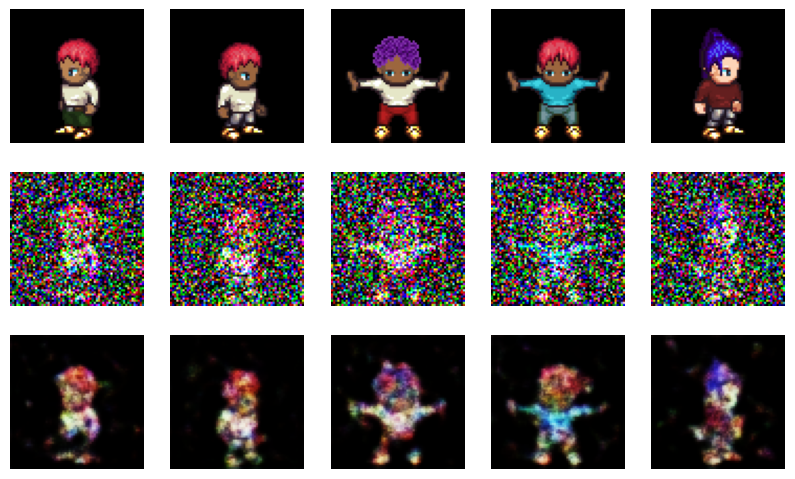

Epoch 37/100 - Train Loss: 0.0116 - Test Loss: 0.0116
Epoch 38/100 - Train Loss: 0.0119 - Test Loss: 0.0119
Epoch 39/100 - Train Loss: 0.0122 - Test Loss: 0.0122
Epoch 40/100 - Train Loss: 0.0125 - Test Loss: 0.0125
Epoch 41/100 - Train Loss: 0.0128 - Test Loss: 0.0128


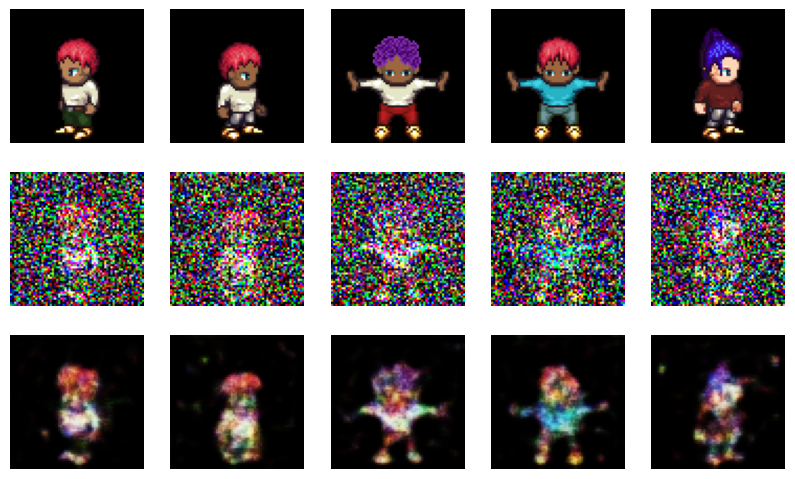

Epoch 42/100 - Train Loss: 0.0131 - Test Loss: 0.0131
Epoch 43/100 - Train Loss: 0.0134 - Test Loss: 0.0134
Epoch 44/100 - Train Loss: 0.0137 - Test Loss: 0.0137
Epoch 45/100 - Train Loss: 0.0140 - Test Loss: 0.0140
Epoch 46/100 - Train Loss: 0.0143 - Test Loss: 0.0143


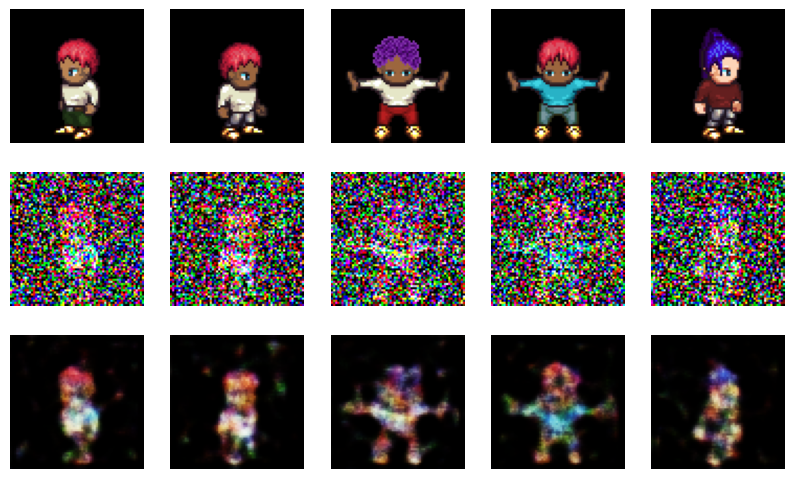

Epoch 47/100 - Train Loss: 0.0146 - Test Loss: 0.0146
Epoch 48/100 - Train Loss: 0.0149 - Test Loss: 0.0149
Epoch 49/100 - Train Loss: 0.0152 - Test Loss: 0.0151
Epoch 50/100 - Train Loss: 0.0154 - Test Loss: 0.0154
Epoch 51/100 - Train Loss: 0.0157 - Test Loss: 0.0157


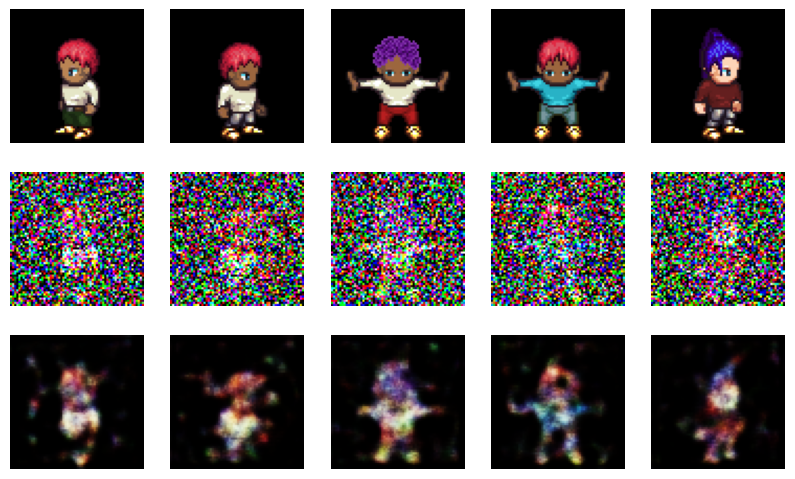

Epoch 52/100 - Train Loss: 0.0160 - Test Loss: 0.0160
Epoch 53/100 - Train Loss: 0.0163 - Test Loss: 0.0163
Epoch 54/100 - Train Loss: 0.0165 - Test Loss: 0.0165
Epoch 55/100 - Train Loss: 0.0168 - Test Loss: 0.0168
Epoch 56/100 - Train Loss: 0.0171 - Test Loss: 0.0171


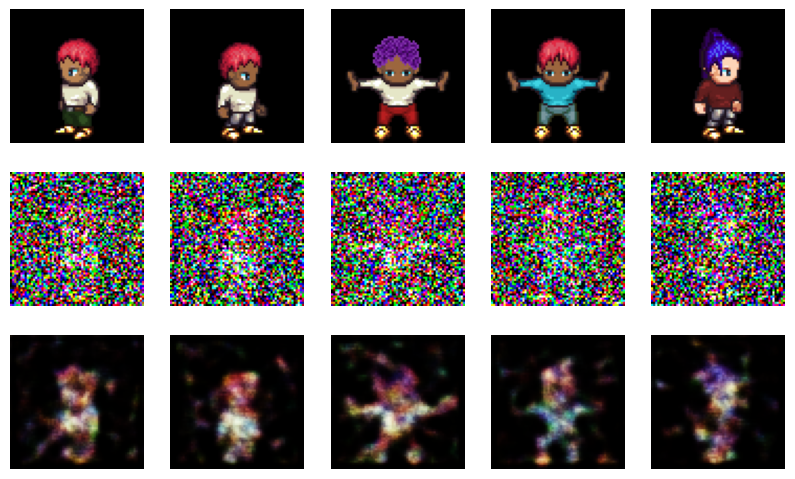

Epoch 57/100 - Train Loss: 0.0173 - Test Loss: 0.0173
Epoch 58/100 - Train Loss: 0.0176 - Test Loss: 0.0176
Epoch 59/100 - Train Loss: 0.0179 - Test Loss: 0.0179
Epoch 60/100 - Train Loss: 0.0181 - Test Loss: 0.0181
Epoch 61/100 - Train Loss: 0.0184 - Test Loss: 0.0184


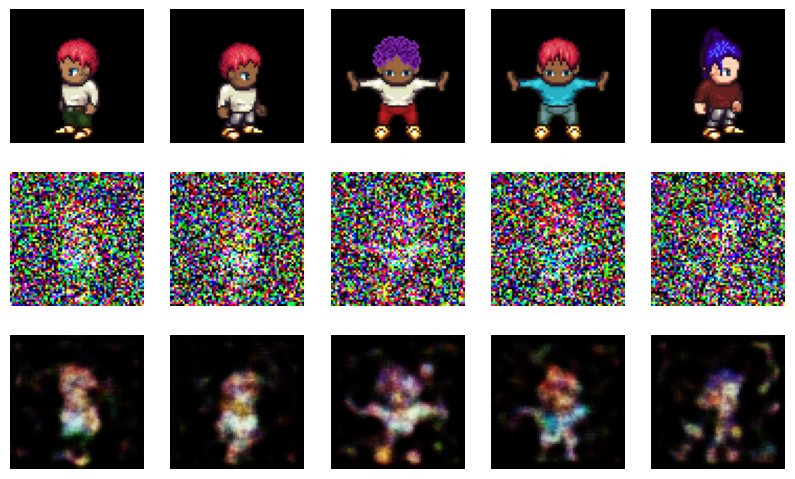

Epoch 62/100 - Train Loss: 0.0186 - Test Loss: 0.0186
Epoch 63/100 - Train Loss: 0.0189 - Test Loss: 0.0189
Epoch 64/100 - Train Loss: 0.0191 - Test Loss: 0.0191
Epoch 65/100 - Train Loss: 0.0194 - Test Loss: 0.0194
Epoch 66/100 - Train Loss: 0.0196 - Test Loss: 0.0196


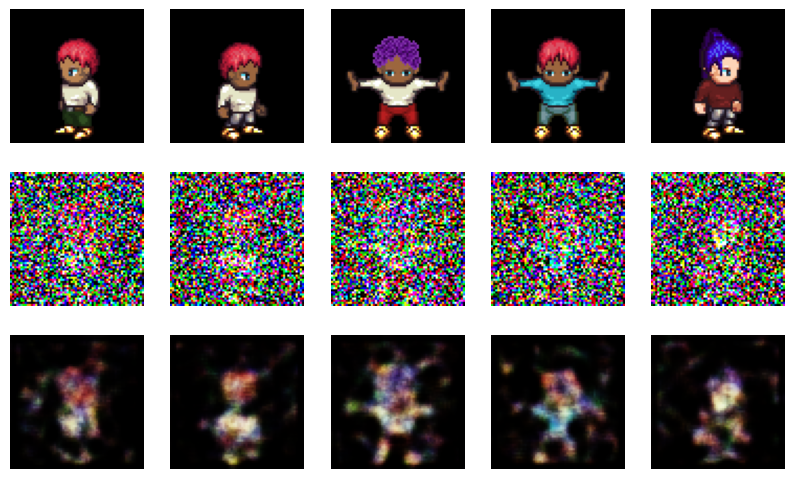

Epoch 67/100 - Train Loss: 0.0199 - Test Loss: 0.0199
Epoch 68/100 - Train Loss: 0.0201 - Test Loss: 0.0201
Epoch 69/100 - Train Loss: 0.0204 - Test Loss: 0.0204
Epoch 70/100 - Train Loss: 0.0206 - Test Loss: 0.0206
Epoch 71/100 - Train Loss: 0.0208 - Test Loss: 0.0208


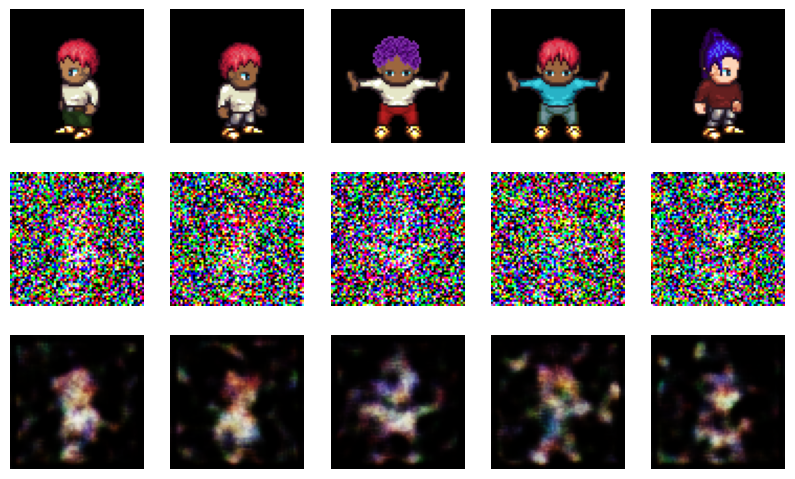

Epoch 72/100 - Train Loss: 0.0211 - Test Loss: 0.0211
Epoch 73/100 - Train Loss: 0.0213 - Test Loss: 0.0213
Epoch 74/100 - Train Loss: 0.0215 - Test Loss: 0.0215
Epoch 75/100 - Train Loss: 0.0218 - Test Loss: 0.0218
Epoch 76/100 - Train Loss: 0.0220 - Test Loss: 0.0220


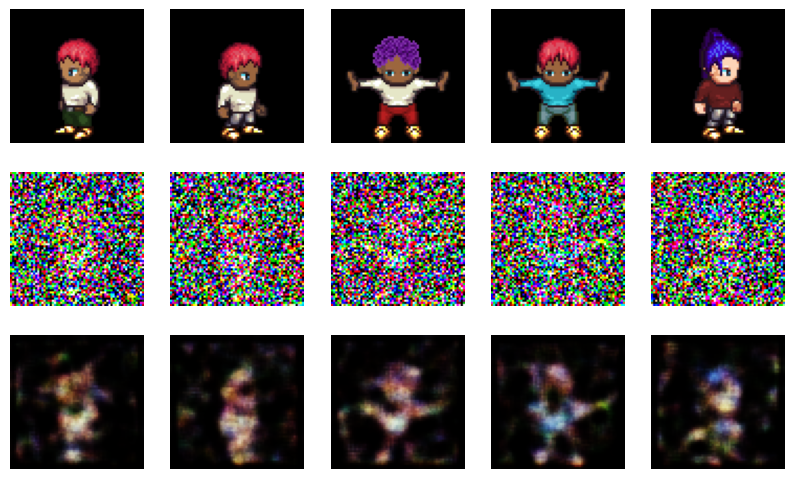

Epoch 77/100 - Train Loss: 0.0222 - Test Loss: 0.0222
Epoch 78/100 - Train Loss: 0.0224 - Test Loss: 0.0224
Epoch 79/100 - Train Loss: 0.0227 - Test Loss: 0.0226
Epoch 80/100 - Train Loss: 0.0229 - Test Loss: 0.0229
Epoch 81/100 - Train Loss: 0.0231 - Test Loss: 0.0231


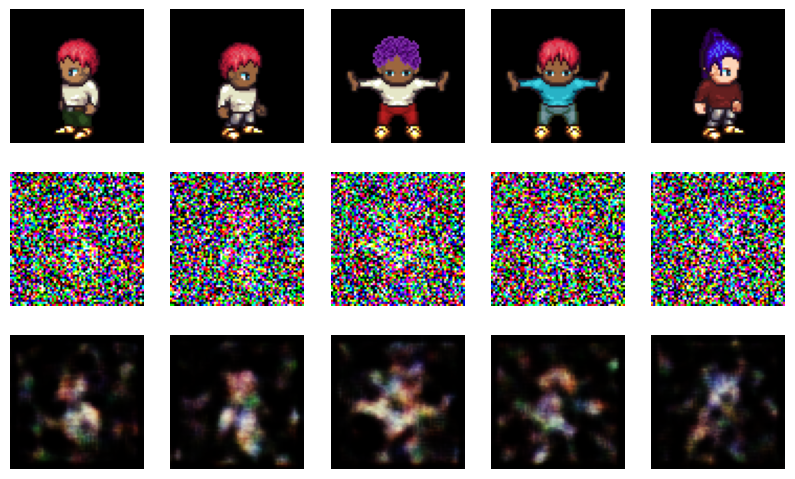

Epoch 82/100 - Train Loss: 0.0233 - Test Loss: 0.0233
Epoch 83/100 - Train Loss: 0.0235 - Test Loss: 0.0235
Epoch 84/100 - Train Loss: 0.0237 - Test Loss: 0.0238
Epoch 85/100 - Train Loss: 0.0239 - Test Loss: 0.0240
Epoch 86/100 - Train Loss: 0.0241 - Test Loss: 0.0242


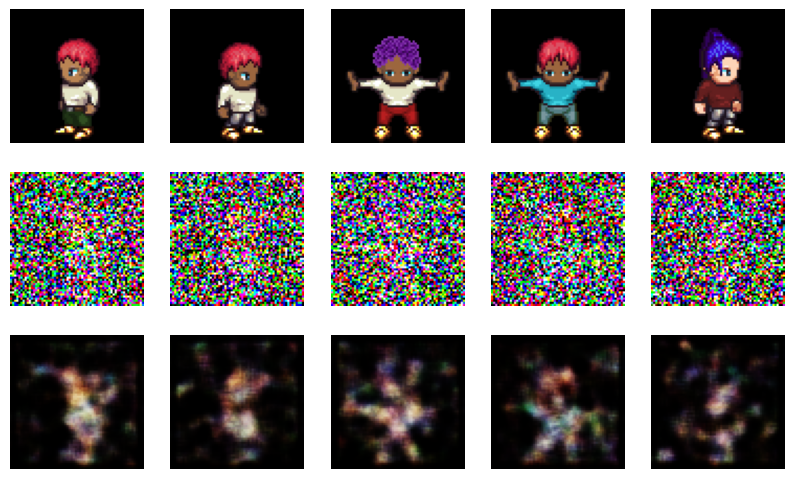

Epoch 87/100 - Train Loss: 0.0244 - Test Loss: 0.0244
Epoch 88/100 - Train Loss: 0.0246 - Test Loss: 0.0246
Epoch 89/100 - Train Loss: 0.0248 - Test Loss: 0.0248
Epoch 90/100 - Train Loss: 0.0250 - Test Loss: 0.0250
Epoch 91/100 - Train Loss: 0.0252 - Test Loss: 0.0252


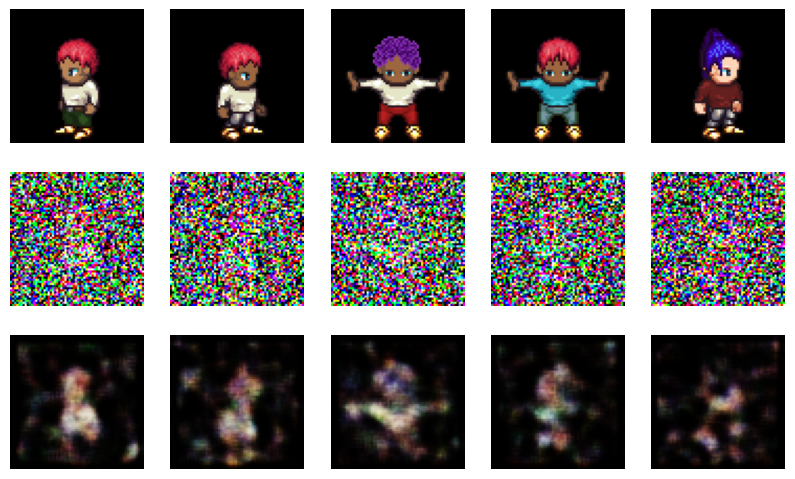

Epoch 92/100 - Train Loss: 0.0254 - Test Loss: 0.0254
Epoch 93/100 - Train Loss: 0.0256 - Test Loss: 0.0256
Epoch 94/100 - Train Loss: 0.0258 - Test Loss: 0.0258
Epoch 95/100 - Train Loss: 0.0260 - Test Loss: 0.0260
Epoch 96/100 - Train Loss: 0.0262 - Test Loss: 0.0262


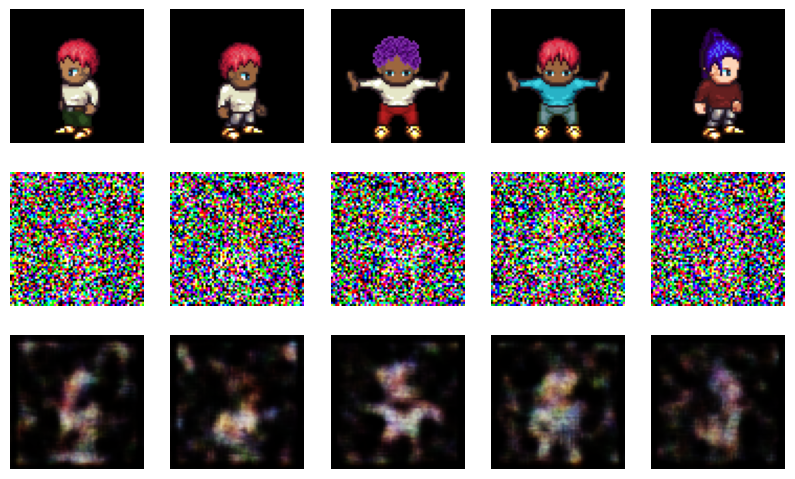

Epoch 97/100 - Train Loss: 0.0264 - Test Loss: 0.0264
Epoch 98/100 - Train Loss: 0.0266 - Test Loss: 0.0266
Epoch 99/100 - Train Loss: 0.0268 - Test Loss: 0.0268
Epoch 100/100 - Train Loss: 0.0269 - Test Loss: 0.0270


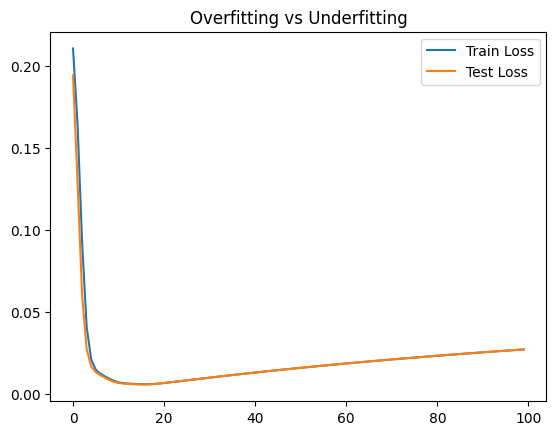

In [4]:
EPOCHS=100
lr=0.000001

# Modelo simple en lugar de UNet
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 3, kernel_size=3, padding=1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

# Inyección progresiva de ruido
def add_noise(imgs, noise_level):
    noise = torch.randn_like(imgs) * noise_level
    return torch.clamp(imgs + noise, 0, 1)

# Entrenamiento
def train(model, train_loader, test_loader, epochs):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    train_loss_history, test_loss_history = [], []
    
    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        for imgs, _ in train_loader:
            imgs = imgs.to(device)
            noisy_imgs = add_noise(imgs, noise_level=(epoch / epochs)*2).to(device)
            optimizer.zero_grad()
            outputs = model(noisy_imgs)
            loss = criterion(outputs, imgs)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_loss /= len(train_loader)
        
        # Evaluación
        model.eval()
        test_loss = 0.0
        with torch.no_grad():
            for imgs, _ in test_loader:
                imgs = imgs.to(device)
                noisy_imgs = add_noise(imgs, noise_level=(epoch / epochs)*2).to(device)
                outputs = model(noisy_imgs)
                loss = criterion(outputs, imgs)
                test_loss += loss.item()
        test_loss /= len(test_loader)
        
        train_loss_history.append(train_loss)
        test_loss_history.append(test_loss)
        
        print(f"Epoch {epoch+1}/{epochs} - Train Loss: {train_loss:.4f} - Test Loss: {test_loss:.4f}")
        
        # Visualizar 5 imágenes
        model.eval()
        imgs, _ = next(iter(test_loader))
        imgs = imgs.to(device)
        noisy_imgs = add_noise(imgs, noise_level=(epoch / epochs)*2).to(device)
        outputs = model(noisy_imgs)
        
        
        if epoch%5 == 0:
            fig, axs = plt.subplots(3, 5, figsize=(10, 6))
            for i in range(5):
                axs[0, i].imshow(np.transpose(imgs[i].cpu().numpy(), (1, 2, 0)))
                axs[0, i].axis("off")
                axs[1, i].imshow(np.transpose(noisy_imgs[i].cpu().numpy(), (1, 2, 0)))
                axs[1, i].axis("off")
                axs[2, i].imshow(np.transpose(outputs[i].cpu().detach().numpy(), (1, 2, 0)))
                axs[2, i].axis("off")
            plt.show()
    
    # Graficar pérdida
    plt.plot(train_loss_history, label="Train Loss")
    plt.plot(test_loss_history, label="Test Loss")
    plt.legend()
    plt.title("Overfitting vs Underfitting")
    plt.show()

# Ejecutar el entrenamiento
model = SimpleCNN().to(device)
train(model, train_loader, test_loader, EPOCHS)


In [4]:
import torch.cuda as cuda
import time

# Generación de imágenes desde ruido puro
def generate_images(model, num_images=5):
    model.eval()
    start_time = time.time()
    with torch.no_grad():
        noise = torch.randn((num_images, 3, img_width, img_height)).to(device)
        generated_images = model(noise)
    end_time = time.time()
    generation_time = end_time - start_time
    print(f"Tiempo de generación: {generation_time:.4f} segundos")
    # Medir consumo de RAM y VRAM
    if device.type == 'cuda':
        vram_usage = cuda.memory_allocated(device) / (1024 ** 2)  # MB
        print(f"Consumo de VRAM: {vram_usage:.2f} MB")
    
    ram_usage = torch.cuda.memory_reserved(device) / (1024 ** 2)  # MB
    print(f"Consumo de RAM: {ram_usage:.2f} MB")
    
    # Visualización
    fig, axs = plt.subplots(1, num_images, figsize=(15, 5))
    for i in range(num_images):
        axs[i].imshow(np.transpose(generated_images[i].cpu().numpy(), (1, 2, 0)))
        axs[i].axis("off")
    plt.show()

Tiempo de generación: 0.0087 segundos
Consumo de VRAM: 0.77 MB
Consumo de RAM: 274.00 MB


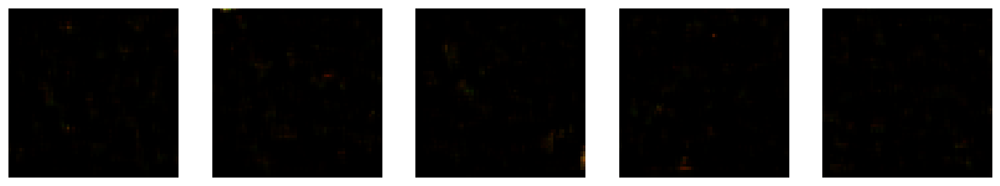

In [5]:
# Generar imágenes desde ruido puro
generate_images(model, num_images=5)

In [7]:
#guardar modelo


import torch

# Asumiendo que 'model' es tu modelo entrenado
PATH = "pruebas modelos/modelos/difussion_state_dicts.pth" # Nombre del archivo a guardar
torch.save(model.state_dict(), PATH)

PATH = "pruebas modelos/modelos/difussion_completo.pth"
torch.save(model, PATH)


